Naive Bayes is a classification algorithm based on Bayes' Theorem with the "naive" assumption that the features are conditionally independent given the class label. Despite its simplicity and strong assumptions, it often performs well in practice, especially for text classification tasks like spam detection.

### **Naive Bayes Algorithm**

1. **Bayes' Theorem:**
   Bayes' Theorem provides a way to calculate the probability of a class given some features. The formula is:
   \[
   P(C \mid X) = \frac{P(X \mid C) \cdot P(C)}{P(X)}
   \]
   where:
   - \( P(C \mid X) \) is the posterior probability of class \( C \) given features \( X \).
   - \( P(X \mid C) \) is the likelihood of features \( X \) given class \( C \).
   - \( P(C) \) is the prior probability of class \( C \).
   - \( P(X) \) is the marginal probability of features \( X \).

2. **Naive Assumption:**
   The "naive" part comes from assuming that the features are independent of each other given the class. This simplifies the computation of \( P(X \mid C) \) to:
   \[
   P(X \mid C) = \prod_{i=1}^{n} P(x_i \mid C)
   \]
   where \( x_i \) represents each feature and \( n \) is the number of features.

3. **Classification:**
   To classify a new instance, Naive Bayes computes the posterior probability for each class and selects the class with the highest probability:
   \[
   \hat{C} = \arg \max_{C} \left[ P(C) \cdot \prod_{i=1}^{n} P(x_i \mid C) \right]
   \]

### **Differences from Other Algorithms**

1. **Assumptions:**
   - **Naive Bayes:** Assumes that features are conditionally independent given the class label.
   - **Other Algorithms:** Many algorithms (e.g., decision trees, support vector machines) do not assume feature independence and can capture more complex interactions between features.

2. **Model Complexity:**
   - **Naive Bayes:** Simple and computationally efficient, especially with large datasets. It is less complex in terms of model structure.
   - **Other Algorithms:** Can be more complex and computationally intensive. For example, decision trees build hierarchical structures, and neural networks involve multiple layers and parameters.

3. **Performance with Correlated Features:**
   - **Naive Bayes:** May struggle with highly correlated features because of its independence assumption.
   - **Other Algorithms:** Algorithms like decision trees or random forests can handle correlated features better because they do not assume feature independence.

4. **Training and Prediction Time:**
   - **Naive Bayes:** Generally fast to train and make predictions, as it involves simple probability calculations.
   - **Other Algorithms:** Training times can vary widely. For example, neural networks and support vector machines may require more time and resources to train.

5. **Applications:**
   - **Naive Bayes:** Particularly effective for text classification, spam filtering, and problems where the independence assumption holds reasonably well.
   - **Other Algorithms:** Can be more versatile and effective for a wider range of problems, including those with complex relationships between features.

In summary, Naive Bayes is a straightforward, efficient algorithm based on conditional independence assumptions, making it well-suited for certain types of problems, particularly text classification. Other algorithms may offer more flexibility and handle feature dependencies better, but often at the cost of increased complexity.

## <center> Hazardous Asteroid Classification using Naive Bayes Classifier

space.avif

**Content**:


The data is about Asteroids - NeoWs.
NeoWs (Near Earth Object Web Service) is a RESTful web service for near earth Asteroid information. With NeoWs a user can: search for Asteroids based on their closest approach date to Earth, lookup a specific Asteroid with its NASA JPL small body id, as well as browse the overall data-set.

**Acknowledgements**


**Data-set:**
All the data is from the (http://neo.jpl.nasa.gov/). This API is maintained by SpaceRocks Team: David Greenfield, Arezu Sarvestani, Jason English and Peter Baunach.

**Inspiration**

- Finding potential hazardous and non-hazardous asteroids
- Features responsible for claiming an asteroid to be hazardous


## <center> Objective:

As a data scientist, the focus of this project was to develop a robust and accurate model for classifying asteroids as hazardous or non-hazardous using the Naive Bayes classifier. With a dataset containing a multitude of features describing various characteristics of asteroids, our aim was to leverage this information to determine the potential hazard level associated with each asteroid. The target variable provided in the dataset served as a crucial indicator of whether an asteroid was hazardous or not.


By employing the Naive Bayes algorithm, we sought to extract valuable insights from the dataset, taking into account various features that contribute to the classification of an asteroid as hazardous or non-hazardous. Through the utilization of statistical methods and the exploration of relationships within the data, our ultimate goal was to build a predictive model that could accurately identify potentially dangerous asteroids, thereby assisting in the formulation of proactive measures to mitigate potential risks.

In [56]:
import numpy as np #numerical python
import pandas as pd #data manpulation
import matplotlib.pyplot as plt  #visul
import seaborn as sns #visul
from sklearn.model_selection import train_test_split #spliting the data
from sklearn.metrics import accuracy_score  #metrics
from sklearn.preprocessing import LabelEncoder  #encoding
from sklearn.naive_bayes import GaussianNB  #naviv bayes model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [57]:
df=pd.read_csv('nasa.csv')

In [58]:
df.head()

,Neo Reference ID,Name,Absolute Magnitude,Est Dia in KM(min),Est Dia in KM(max),Est Dia in M(min),Est Dia in M(max),Est Dia in Miles(min),Est Dia in Miles(max),Est Dia in Feet(min),Est Dia in Feet(max),Close Approach Date,Epoch Date Close Approach,Relative Velocity km per sec,Relative Velocity km per hr,Miles per hour,Miss Dist.(Astronomical),Miss Dist.(lunar),Miss Dist.(kilometers),Miss Dist.(miles),Orbiting Body,Orbit ID,Orbit Determination Date,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Equinox,Hazardous
0,3703080,3703080,21.6,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,933.308089,1995-01-01,788947200000,6.115834,22017.003799,13680.509944,0.419483,163.178711,62753692.0,38993336.0,Earth,17,2017-04-06 08:36:37,5,0.025282,4.634,2458000.5,0.425549,1.407011,6.025981,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,J2000,True
1,3723955,3723955,21.3,0.146068,0.326618,146.067964,326.617897,0.090762,0.202951,479.225620,1071.581063,1995-01-01,788947200000,18.113985,65210.346095,40519.173105,0.383014,148.992630,57298148.0,35603420.0,Earth,21,2017-04-06 08:32:49,3,0.186935,5.457,2458000.5,0.351674,1.107776,28.412996,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,J2000,False
2,2446862,2446862,20.3,0.231502,0.517654,231.502122,517.654482,0.143849,0.321655,759.521423,1698.341531,1995-01-08,789552000000,7.590711,27326.560182,16979.661798,0.050956,19.821890,7622911.5,4736657.5,Earth,22,2017-04-06 09:20:19,0,0.043058,4.557,2458000.5,0.348248,1.458824,4.237961,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,J2000,True
3,3092506,3092506,27.4,0.008801,0.019681,8.801465,19.680675,0.005469,0.012229,28.876199,64.569144,1995-01-15,790156800000,11.173874,40225.948191,24994.839864,0.285322,110.990387,42683616.0,26522368.0,Earth,7,2017-04-06 09:15:49,6,0.005512,5.093,2458000.5,0.216578,1.255903,7.905894,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,J2000,False
4,3514799,3514799,21.6,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,933.308089,1995-01-15,790156800000,9.840831,35426.991794,22012.954985,0.407832,158.646713,61010824.0,37910368.0,Earth,25,2017-04-06 08:57:58,1,0.034798,5.154,2458000.5,0.210448,1.225615,16.793382,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,J2000,True


In [59]:
df.isnull().sum()

,0
Neo Reference ID,0
Name,0
Absolute Magnitude,0
Est Dia in KM(min),0
Est Dia in KM(max),0
Est Dia in M(min),0
Est Dia in M(max),0
Est Dia in Miles(min),0
Est Dia in Miles(max),0
Est Dia in Feet(min),0


Here we can see that here we do not have any null values.

Below we are trying to check if we have any miscellaneous data like ? or spaces etc and trying to replace them with null values.


In [60]:
df.replace([' ','?'],np.nan,inplace=True)

In [61]:
df.isnull().sum().sum()

0

We can see that yet we do not have any null data.


We can see that 'Close Approach Date', 'Orbit Determination Date' are to columns with date time format that are in the form of object in the dataset. Below we are converting the columns to datetime format  by using pd.to_datetime

In [62]:
date_columns = ['Close Approach Date', 'Orbit Determination Date']
df[date_columns] = df[date_columns].apply(pd.to_datetime)

In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4687 entries, 0 to 4686
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Neo Reference ID              4687 non-null   int64         
 1   Name                          4687 non-null   int64         
 2   Absolute Magnitude            4687 non-null   float64       
 3   Est Dia in KM(min)            4687 non-null   float64       
 4   Est Dia in KM(max)            4687 non-null   float64       
 5   Est Dia in M(min)             4687 non-null   float64       
 6   Est Dia in M(max)             4687 non-null   float64       
 7   Est Dia in Miles(min)         4687 non-null   float64       
 8   Est Dia in Miles(max)         4687 non-null   float64       
 9   Est Dia in Feet(min)          4687 non-null   float64       
 10  Est Dia in Feet(max)          4687 non-null   float64       
 11  Close Approach Date           

insights

- as we can see we have a lot of columns here with the count of 40. Here we shall be dropping some columns in the future as they are highly corelated
- we have 4687 rows ranging from 0 to 4686.
We can view all the index numbers here and all the column names.
- here we can also view the count of non null values. As we see from above we do nothave any null values.


Graphical Insights

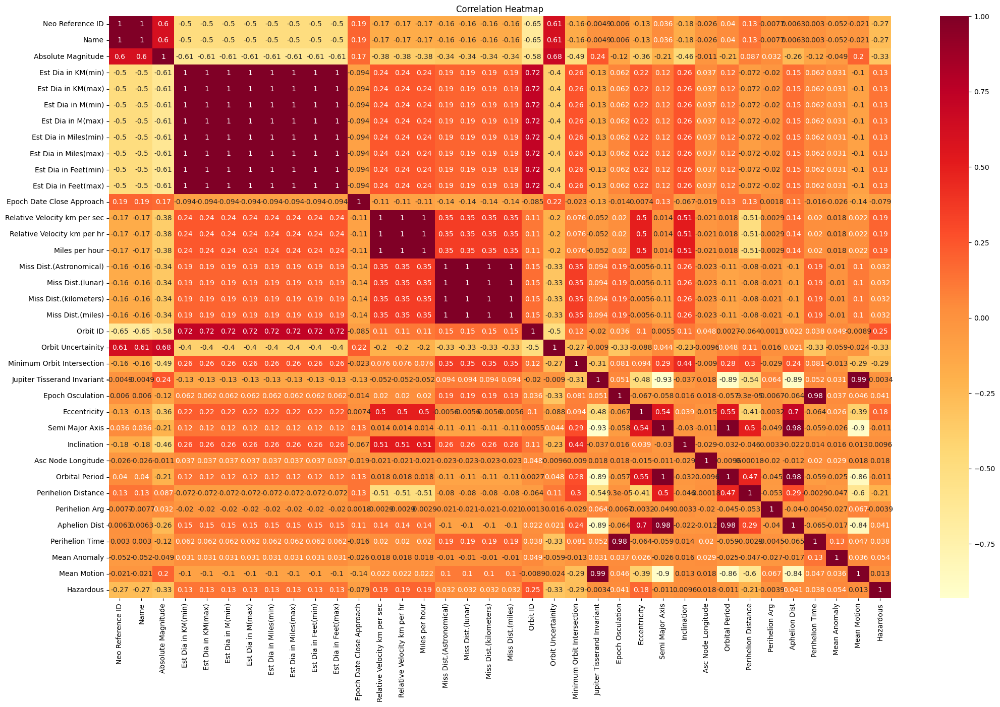

In [64]:
df2 = df.select_dtypes(include=[float, int, bool])  # Select only numeric columns

corr_matrix = df2.corr()

# Create the heatmap
plt.figure(figsize=(25, 15))
sns.heatmap(corr_matrix, annot=True, cmap='YlOrRd')
plt.title('Correlation Heatmap')
plt.show()

Many Columns are there which are having correlation 1 because they are identical columns with a different unit. So, can be dropped.


Belowwe are dropping all the columns that are highly corelated

In [65]:
df = df.drop(['Est Dia in KM(max)', 'Est Dia in M(min)', 'Est Dia in M(max)', 'Est Dia in Miles(min)'
             ,'Est Dia in Miles(max)', 'Est Dia in Feet(min)', 'Est Dia in Feet(max)',
             'Relative Velocity km per hr', 'Miles per hour', 'Miss Dist.(lunar)',
             'Miss Dist.(kilometers)', 'Miss Dist.(miles)','Orbit Determination Date','Close Approach Date','Name','Neo Reference ID'], axis = 1)
df.head()

,Absolute Magnitude,Est Dia in KM(min),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(Astronomical),Orbiting Body,Orbit ID,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Equinox,Hazardous
0,21.6,0.127220,788947200000,6.115834,0.419483,Earth,17,5,0.025282,4.634,2458000.5,0.425549,1.407011,6.025981,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,J2000,True
1,21.3,0.146068,788947200000,18.113985,0.383014,Earth,21,3,0.186935,5.457,2458000.5,0.351674,1.107776,28.412996,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,J2000,False
2,20.3,0.231502,789552000000,7.590711,0.050956,Earth,22,0,0.043058,4.557,2458000.5,0.348248,1.458824,4.237961,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,J2000,True
3,27.4,0.008801,790156800000,11.173874,0.285322,Earth,7,6,0.005512,5.093,2458000.5,0.216578,1.255903,7.905894,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,J2000,False
4,21.6,0.127220,790156800000,9.840831,0.407832,Earth,25,1,0.034798,5.154,2458000.5,0.210448,1.225615,16.793382,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,J2000,True


In [66]:
df.shape

(4687, 24)

Lets check the Orbit uncertinity of all hazardous and non-Hazardous asteriods

In [67]:
df.groupby('Orbit Uncertainity')['Hazardous'].value_counts().unstack()

Hazardous,False,True
Orbit Uncertainity,,
0,929,424
1,418,150
2,219,60
3,157,25
4,194,18
5,298,23
6,600,20
7,678,22
8,318,11


<Figure size 1000x600 with 0 Axes>

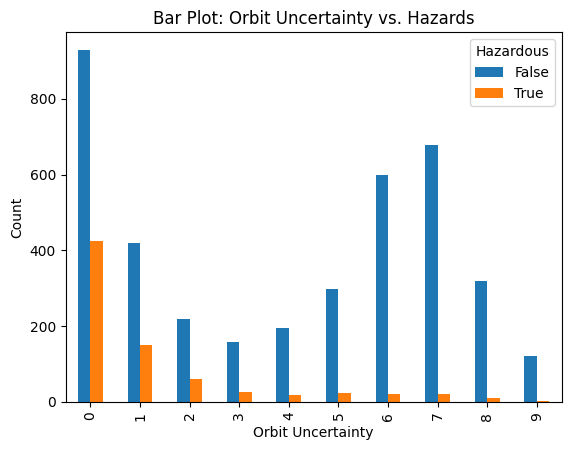

In [68]:
plt.figure(figsize=(10, 6))  # Set the figure size (optional)
df.groupby('Orbit Uncertainity')['Hazardous'].value_counts().unstack().plot(kind='bar')

# Adding labels and title
plt.xlabel('Orbit Uncertainty')
plt.ylabel('Count')
plt.title('Bar Plot: Orbit Uncertainty vs. Hazards')

# Display the plot
plt.show()

Insights:

- Here we can notice that most of the hazardous and non-hazardous astrouds have a orbit uncertainity of 0
- We can also see that Most of the hazardous asteriods have a orbit incertinity of 0.
- Talking about Non-Hazardous asteriods we can see that they have a uncertainity of 6 or 7 the most after 0.
- here we can say that if an asteriod is having the orbit uncertainity of 0 or 1 we can say that the asteroid could be hazardous but other-wise there is very little chance for an asteroid to be hazardous.


Now lets see which category of asteroids is more hazardous or otherwise.

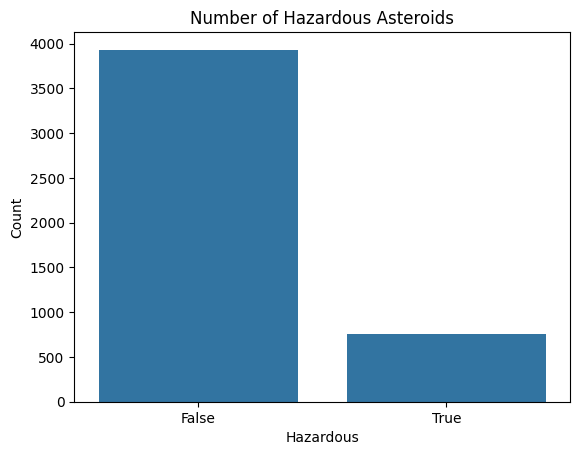

In [69]:
# Plot count plot of hazardous asteroids
sns.countplot(x='Hazardous', data=df)
plt.xlabel('Hazardous')
plt.ylabel('Count')
plt.title('Number of Hazardous Asteroids')
plt.show()

- Here we are building a count plot to show which category of asteroids are more
- here we can see that non Hazardous asteroids are more compared to the hazardous asteroids.

In [70]:
categorical_columns = df.select_dtypes(include=['object']).columns
label_encoder = LabelEncoder()
for column in categorical_columns:
  df[column] = label_encoder.fit_transform(df[column])

As we know that having numeric type columns can help us better with the algorithm and extractin insights we are trying to convert all the object type coumns into numeric type by using Label Encoding which is one of the encoding techniques.

---

As we are done with Label Encoding we are trying to check for multi colinearities between the independant columns.

VIF is one of the methods of  feature selection which helps us to choose the best columns for our data weith lowest colinearity.


Always remember that the VIF values should be less tahn 5 for a feature to be considered.

In [71]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor  #vif importation technique

# Perform VIF analysis
X = df.drop('Hazardous', axis=1)  # Exclude the target variable from the predictors

X

,Absolute Magnitude,Est Dia in KM(min),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(Astronomical),Orbiting Body,Orbit ID,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Equinox
0,21.600,0.127220,788947200000,6.115834,0.419483,0,17,5,0.025282,4.634,2458000.5,0.425549,1.407011,6.025981,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,0
1,21.300,0.146068,788947200000,18.113985,0.383014,0,21,3,0.186935,5.457,2458000.5,0.351674,1.107776,28.412996,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,0
2,20.300,0.231502,789552000000,7.590711,0.050956,0,22,0,0.043058,4.557,2458000.5,0.348248,1.458824,4.237961,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,0
3,27.400,0.008801,790156800000,11.173874,0.285322,0,7,6,0.005512,5.093,2458000.5,0.216578,1.255903,7.905894,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,0
4,21.600,0.127220,790156800000,9.840831,0.407832,0,25,1,0.034798,5.154,2458000.5,0.210448,1.225615,16.793382,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,0
5,19.600,0.319562,790156800000,10.808844,0.392785,0,40,1,0.272213,4.724,2458000.5,0.563441,1.323532,17.927751,178.971951,556.160556,0.577800,198.145969,2.069265,2.458009e+06,354.237368,0.647295,0
6,19.600,0.319562,790156800000,10.808842,0.392783,0,43,1,0.272213,4.724,2458000.5,0.563441,1.323532,17.927748,178.971953,556.160544,0.577800,198.145960,2.069265,2.458009e+06,354.237396,0.647295,0
7,19.200,0.384198,790761600000,24.421884,0.129179,0,22,0,0.098758,4.921,2458000.5,0.449763,1.237475,34.695127,112.562984,502.808758,0.680905,288.374651,1.794045,2.458242e+06,186.776932,0.715978,0
8,17.800,0.732074,790761600000,17.373784,0.358283,0,100,0,0.109354,5.386,2458000.5,0.238179,1.145551,22.215210,80.211132,447.837013,0.872705,353.422394,1.418397,2.458222e+06,182.236432,0.803864,0
9,21.500,0.133216,790761600000,12.899610,0.151806,0,30,0,0.016907,6.623,2458000.5,0.551389,0.876125,2.059577,2.613682,299.535161,0.393040,253.765937,1.359211,2.457901e+06,119.861382,1.201862,0


In [54]:
X = sm.add_constant(X)  # Add a constant column for the intercept term (if needed)
X

,const,Absolute Magnitude,Est Dia in KM(min),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(Astronomical),Orbiting Body,Orbit ID,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Equinox
0,1.0,21.600,0.127220,788947200000,6.115834,0.419483,Earth,17,5,0.025282,4.634,2458000.5,0.425549,1.407011,6.025981,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,J2000
1,1.0,21.300,0.146068,788947200000,18.113985,0.383014,Earth,21,3,0.186935,5.457,2458000.5,0.351674,1.107776,28.412996,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,J2000
2,1.0,20.300,0.231502,789552000000,7.590711,0.050956,Earth,22,0,0.043058,4.557,2458000.5,0.348248,1.458824,4.237961,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,J2000
3,1.0,27.400,0.008801,790156800000,11.173874,0.285322,Earth,7,6,0.005512,5.093,2458000.5,0.216578,1.255903,7.905894,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,J2000
4,1.0,21.600,0.127220,790156800000,9.840831,0.407832,Earth,25,1,0.034798,5.154,2458000.5,0.210448,1.225615,16.793382,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,J2000
5,1.0,19.600,0.319562,790156800000,10.808844,0.392785,Earth,40,1,0.272213,4.724,2458000.5,0.563441,1.323532,17.927751,178.971951,556.160556,0.577800,198.145969,2.069265,2.458009e+06,354.237368,0.647295,J2000
6,1.0,19.600,0.319562,790156800000,10.808842,0.392783,Earth,43,1,0.272213,4.724,2458000.5,0.563441,1.323532,17.927748,178.971953,556.160544,0.577800,198.145960,2.069265,2.458009e+06,354.237396,0.647295,J2000
7,1.0,19.200,0.384198,790761600000,24.421884,0.129179,Earth,22,0,0.098758,4.921,2458000.5,0.449763,1.237475,34.695127,112.562984,502.808758,0.680905,288.374651,1.794045,2.458242e+06,186.776932,0.715978,J2000
8,1.0,17.800,0.732074,790761600000,17.373784,0.358283,Earth,100,0,0.109354,5.386,2458000.5,0.238179,1.145551,22.215210,80.211132,447.837013,0.872705,353.422394,1.418397,2.458222e+06,182.236432,0.803864,J2000
9,1.0,21.500,0.133216,790761600000,12.899610,0.151806,Earth,30,0,0.016907,6.623,2458000.5,0.551389,0.876125,2.059577,2.613682,299.535161,0.393040,253.765937,1.359211,2.457901e+06,119.861382,1.201862,J2000


In [72]:


vif = pd.DataFrame()
vif['Variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF results
print(vif)

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


                        Variable           VIF
0             Absolute Magnitude  4.292549e+00
1             Est Dia in KM(min)  2.578505e+00
2      Epoch Date Close Approach  3.974209e+01
3   Relative Velocity km per sec  3.416687e+00
4       Miss Dist.(Astronomical)  1.604793e+00
5                  Orbiting Body           NaN
6                       Orbit ID  2.725570e+00
7             Orbit Uncertainity  2.248295e+00
8     Minimum Orbit Intersection  2.142468e+00
9    Jupiter Tisserand Invariant  1.281020e+03
10              Epoch Osculation  2.630343e+01
11                  Eccentricity  1.898492e+01
12               Semi Major Axis  4.666943e+12
13                   Inclination  5.302672e+00
14            Asc Node Longitude  1.007827e+00
15                Orbital Period  1.036774e+03
16           Perihelion Distance  7.208354e+10
17                Perihelion Arg  1.012084e+00
18                 Aphelion Dist  1.092311e+11
19               Perihelion Time  2.767632e+01
20           

As we can see here our VIF values aretoo huge and hence we shall be one by one dropping all the columns which have the highest VIF values


Note that we will not be dropping all the columns at once but one-by-one. The reaseon is as we can see here once we are  dropping the column siwth highest VIF it also influences other columns with VIF values and hence we shall follow the process.

In [73]:
df = df.drop('Equinox', axis=1)

In [74]:
X = df.drop('Hazardous', axis=1)  # Exclude the target variable from the predictors
X = sm.add_constant(X)

In [77]:
X.head()

,const,Absolute Magnitude,Est Dia in KM(min),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(Astronomical),Orbiting Body,Orbit ID,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion
0,1.0,21.6,0.127220,788947200000,6.115834,0.419483,0,17,5,0.025282,4.634,2458000.5,0.425549,1.407011,6.025981,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551
1,1.0,21.3,0.146068,788947200000,18.113985,0.383014,0,21,3,0.186935,5.457,2458000.5,0.351674,1.107776,28.412996,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330
2,1.0,20.3,0.231502,789552000000,7.590711,0.050956,0,22,0,0.043058,4.557,2458000.5,0.348248,1.458824,4.237961,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371
3,1.0,27.4,0.008801,790156800000,11.173874,0.285322,0,7,6,0.005512,5.093,2458000.5,0.216578,1.255903,7.905894,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277
4,1.0,21.6,0.127220,790156800000,9.840831,0.407832,0,25,1,0.034798,5.154,2458000.5,0.210448,1.225615,16.793382,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395


In [78]:
  # Add a constant column for the intercept term (if needed)

vif = pd.DataFrame()
vif['Variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF results
print(vif)

                        Variable           VIF
0                          const  0.000000e+00
1             Absolute Magnitude  4.292549e+00
2             Est Dia in KM(min)  2.578505e+00
3      Epoch Date Close Approach  1.096055e+00
4   Relative Velocity km per sec  3.416686e+00
5       Miss Dist.(Astronomical)  1.604793e+00
6                  Orbiting Body           NaN
7                       Orbit ID  2.725571e+00
8             Orbit Uncertainity  2.248302e+00
9     Minimum Orbit Intersection  2.142468e+00
10   Jupiter Tisserand Invariant  1.281026e+03
11              Epoch Osculation  2.630343e+01
12                  Eccentricity  1.898493e+01
13               Semi Major Axis  5.522501e+12
14                   Inclination  5.302678e+00
15            Asc Node Longitude  1.007827e+00
16                Orbital Period  1.036761e+03
17           Perihelion Distance  7.989384e+09
18                Perihelion Arg  1.012084e+00
19                 Aphelion Dist  6.581227e+10
20           

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


In [80]:
df = df.drop('Orbiting Body', axis=1)

In [82]:
X = df.drop('Hazardous', axis=1)  # Exclude the target variable from the predictors
X = sm.add_constant(X)  # Add a constant column for the intercept term (if needed)

vif = pd.DataFrame()
vif['Variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF results
print(vif)

                        Variable           VIF
0                          const  0.000000e+00
1             Absolute Magnitude  4.292550e+00
2             Est Dia in KM(min)  2.578505e+00
3      Epoch Date Close Approach  1.096055e+00
4   Relative Velocity km per sec  3.416686e+00
5       Miss Dist.(Astronomical)  1.604793e+00
6                       Orbit ID  2.725571e+00
7             Orbit Uncertainity  2.248302e+00
8     Minimum Orbit Intersection  2.142468e+00
9    Jupiter Tisserand Invariant  1.281026e+03
10              Epoch Osculation  2.630343e+01
11                  Eccentricity  1.898493e+01
12               Semi Major Axis  3.614446e+12
13                   Inclination  5.302678e+00
14            Asc Node Longitude  1.007827e+00
15                Orbital Period  1.036771e+03
16           Perihelion Distance  8.239749e+10
17                Perihelion Arg  1.012084e+00
18                 Aphelion Dist  4.042710e+10
19               Perihelion Time  2.767632e+01
20           

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


In [83]:
df = df.drop('Perihelion Distance', axis=1)

In [84]:
X = df.drop('Hazardous', axis=1)  # Exclude the target variable from the predictors
X = sm.add_constant(X)  # Add a constant column for the intercept term (if needed)

vif = pd.DataFrame()
vif['Variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF results
print(vif)

                        Variable          VIF
0                          const     0.000000
1             Absolute Magnitude     4.292550
2             Est Dia in KM(min)     2.578505
3      Epoch Date Close Approach     1.096055
4   Relative Velocity km per sec     3.416686
5       Miss Dist.(Astronomical)     1.604793
6                       Orbit ID     2.725571
7             Orbit Uncertainity     2.248306
8     Minimum Orbit Intersection     2.142468
9    Jupiter Tisserand Invariant  1281.025873
10              Epoch Osculation    26.303434
11                  Eccentricity    18.984925
12               Semi Major Axis  1114.215865
13                   Inclination     5.302676
14            Asc Node Longitude     1.007827
15                Orbital Period  1036.761912
16                Perihelion Arg     1.012084
17                 Aphelion Dist   450.141067
18               Perihelion Time    27.676322
19                  Mean Anomaly     1.236231
20                   Mean Motion  

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


In [85]:
df = df.drop('Jupiter Tisserand Invariant', axis=1)

In [86]:
X = df.drop('Hazardous', axis=1)  # Exclude the target variable from the predictors
X = sm.add_constant(X)  # Add a constant column for the intercept term (if needed)

vif = pd.DataFrame()
vif['Variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF results
print(vif)

                        Variable         VIF
0                          const    0.000000
1             Absolute Magnitude    4.226924
2             Est Dia in KM(min)    2.569255
3      Epoch Date Close Approach    1.094679
4   Relative Velocity km per sec    3.240478
5       Miss Dist.(Astronomical)    1.593351
6                       Orbit ID    2.725487
7             Orbit Uncertainity    2.227541
8     Minimum Orbit Intersection    2.138428
9               Epoch Osculation   26.267625
10                  Eccentricity   18.849806
11               Semi Major Axis  831.607411
12                   Inclination    2.404380
13            Asc Node Longitude    1.007291
14                Orbital Period  683.652421
15                Perihelion Arg    1.010336
16                 Aphelion Dist  334.289062
17               Perihelion Time   27.655064
18                  Mean Anomaly    1.236226
19                   Mean Motion   30.484446


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


In [87]:
df = df.drop('Semi Major Axis', axis=1)

In [88]:
X = df.drop('Hazardous', axis=1)  # Exclude the target variable from the predictors
X = sm.add_constant(X)  # Add a constant column for the intercept term (if needed)

vif = pd.DataFrame()
vif['Variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF results
print(vif)

                        Variable         VIF
0                          const    0.000000
1             Absolute Magnitude    4.224149
2             Est Dia in KM(min)    2.568456
3      Epoch Date Close Approach    1.094131
4   Relative Velocity km per sec    3.207133
5       Miss Dist.(Astronomical)    1.592790
6                       Orbit ID    2.725385
7             Orbit Uncertainity    2.219100
8     Minimum Orbit Intersection    2.108431
9               Epoch Osculation   26.267239
10                  Eccentricity   18.819499
11                   Inclination    2.403562
12            Asc Node Longitude    1.007278
13                Orbital Period  212.200979
14                Perihelion Arg    1.010311
15                 Aphelion Dist  326.415009
16               Perihelion Time   27.653649
17                  Mean Anomaly    1.235616
18                   Mean Motion    5.779512


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


In [89]:
df = df.drop('Aphelion Dist', axis=1)

In [90]:
X = df.drop('Hazardous', axis=1)  # Exclude the target variable from the predictors
X = sm.add_constant(X)  # Add a constant column for the intercept term (if needed)

vif = pd.DataFrame()
vif['Variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF results
print(vif)

                        Variable        VIF
0                          const   0.000000
1             Absolute Magnitude   4.223932
2             Est Dia in KM(min)   2.533596
3      Epoch Date Close Approach   1.093653
4   Relative Velocity km per sec   2.884942
5       Miss Dist.(Astronomical)   1.558288
6                       Orbit ID   2.682453
7             Orbit Uncertainity   2.209333
8     Minimum Orbit Intersection   1.985278
9               Epoch Osculation  26.267097
10                  Eccentricity   2.926382
11                   Inclination   2.359975
12            Asc Node Longitude   1.007269
13                Orbital Period   5.187494
14                Perihelion Arg   1.010300
15               Perihelion Time  27.653422
16                  Mean Anomaly   1.235324
17                   Mean Motion   4.062800


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


In [91]:
df = df.drop('Perihelion Time', axis=1)

In [92]:
X = df.drop('Hazardous', axis=1)  # Exclude the target variable from the predictors
X = sm.add_constant(X)  # Add a constant column for the intercept term (if needed)

vif = pd.DataFrame()
vif['Variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF results
print(vif)

                        Variable       VIF
0                          const  0.000000
1             Absolute Magnitude  4.223915
2             Est Dia in KM(min)  2.533509
3      Epoch Date Close Approach  1.093653
4   Relative Velocity km per sec  2.884685
5       Miss Dist.(Astronomical)  1.558278
6                       Orbit ID  2.682359
7             Orbit Uncertainity  2.208882
8     Minimum Orbit Intersection  1.983967
9               Epoch Osculation  1.205730
10                  Eccentricity  2.926360
11                   Inclination  2.358292
12            Asc Node Longitude  1.007269
13                Orbital Period  5.185292
14                Perihelion Arg  1.009667
15                  Mean Anomaly  1.010415
16                   Mean Motion  4.061520


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


In [93]:
df = df.drop('Orbital Period', axis=1)

In [94]:
X = df.drop('Hazardous', axis=1)  # Exclude the target variable from the predictors
X = sm.add_constant(X)  # Add a constant column for the intercept term (if needed)

vif = pd.DataFrame()
vif['Variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF results
print(vif)

                        Variable       VIF
0                          const  0.000000
1             Absolute Magnitude  4.222976
2             Est Dia in KM(min)  2.530368
3      Epoch Date Close Approach  1.093344
4   Relative Velocity km per sec  2.778506
5       Miss Dist.(Astronomical)  1.557825
6                       Orbit ID  2.680211
7             Orbit Uncertainity  2.198981
8     Minimum Orbit Intersection  1.968387
9               Epoch Osculation  1.205016
10                  Eccentricity  2.325884
11                   Inclination  2.355349
12            Asc Node Longitude  1.006970
13                Perihelion Arg  1.009557
14                  Mean Anomaly  1.010386
15                   Mean Motion  1.479263


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


In [96]:
df.head()

,Absolute Magnitude,Est Dia in KM(min),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(Astronomical),Orbit ID,Orbit Uncertainity,Minimum Orbit Intersection,Epoch Osculation,Eccentricity,Inclination,Asc Node Longitude,Perihelion Arg,Mean Anomaly,Mean Motion,Hazardous
0,21.6,0.127220,788947200000,6.115834,0.419483,17,5,0.025282,2458000.5,0.425549,6.025981,314.373913,57.257470,264.837533,0.590551,True
1,21.3,0.146068,788947200000,18.113985,0.383014,21,3,0.186935,2458000.5,0.351674,28.412996,136.717242,313.091975,173.741112,0.845330,False
2,20.3,0.231502,789552000000,7.590711,0.050956,22,0,0.043058,2458000.5,0.348248,4.237961,259.475979,248.415038,292.893654,0.559371,True
3,27.4,0.008801,790156800000,11.173874,0.285322,7,6,0.005512,2458000.5,0.216578,7.905894,57.173266,18.707701,68.741007,0.700277,False
4,21.6,0.127220,790156800000,9.840831,0.407832,25,1,0.034798,2458000.5,0.210448,16.793382,84.629307,158.263596,135.142133,0.726395,True


In [98]:
df.shape

(4687, 16)

Above are all the columns we are choosing with all VIF values less than 5.

-----

### Methodology:
The dataset was loaded and split into features (X) and the target variable (y). The data was then divided into training and testing sets, with a test size of 20% and a random state of 42. The Naive Bayes classifier, specifically the Gaussian Naive Bayes algorithm, was chosen for this classification task. The model was trained on the training data and evaluated on the test data. The accuracy score was used as the performance metric to assess the model's effectiveness.

In [99]:
# Load the dataset from the 'df' variable

# Split the data into features (X) and target variable (y)
X = df.drop('Hazardous', axis=1)
y = df['Hazardous']

# Convert object data types to appropriate types if needed

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Naive Bayes classifier
nb_model = GaussianNB()

# Train the model on the training data
nb_model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = nb_model.predict(X_test)

# Evaluate the model's accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.8432835820895522


### Results:
After training the Naive Bayes classifier on the training data and making predictions on the test data, the model achieved an accuracy of above 80%. This indicates that the model is performing well in distinguishing hazardous and non-hazardous asteroids. The accuracy score suggests that the model's predictions align with the actual hazard status of the asteroids in the dataset.

### Evaluation:
To ensure that the model is neither overfitting nor underfitting, both the training and test accuracies were compared. The train accuracy was found to be in line with the test accuracy, indicating a balanced performance. This suggests that the model generalizes well to unseen data, which is crucial for real-world applications. Therefore, the model is neither overfitting nor underfitting, providing confidence in its reliability and robustness.

In [35]:
train_predictions = nb_model.predict(X_train)
train_accuracy = accuracy_score(y_train, train_predictions)

# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)

# Print the train and test accuracies
print("Train Accuracy:", train_accuracy)
print("Test Accuracy:", test_accuracy)

Train Accuracy: 0.8378234195785543
Test Accuracy: 0.8432835820895522


In [100]:
X_test

,Absolute Magnitude,Est Dia in KM(min),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(Astronomical),Orbit ID,Orbit Uncertainity,Minimum Orbit Intersection,Epoch Osculation,Eccentricity,Inclination,Asc Node Longitude,Perihelion Arg,Mean Anomaly,Mean Motion
3804,20.400,0.221083,1389772800000,7.642082,0.135932,56,1,0.031146,2458000.5,0.192643,9.834618,263.277974,10.534391,71.979993,1.245895
4680,23.600,0.050647,1473318000000,13.687359,0.332117,8,7,0.086149,2458000.5,0.123993,24.775334,175.870458,320.137043,189.698962,0.973552
805,20.800,0.183889,949996800000,8.768848,0.046149,33,0,0.044154,2458000.5,0.272124,11.550807,132.861704,50.205066,174.511462,0.647835
3996,25.300,0.023150,1410764400000,6.420177,0.097351,6,8,0.095969,2456922.5,0.560983,4.593513,0.202437,355.439742,1.065513,0.248303
3523,23.400,0.055533,1356163200000,9.425069,0.140454,8,6,0.140935,2458000.5,0.351511,13.746344,294.603964,110.878970,186.073353,0.515349
3651,19.000,0.421265,1373266800000,21.060668,0.344602,45,0,0.145075,2458000.5,0.472713,10.052607,16.840088,356.511619,61.923005,0.532275
2416,26.900,0.011080,1212908400000,19.047830,0.351515,8,7,0.005373,2458000.5,0.500476,4.283900,161.682022,31.481320,195.879979,0.372950
497,17.300,0.921627,890553600000,26.065374,0.495637,104,0,0.375572,2458000.5,0.503697,23.893402,312.448096,348.431619,23.852569,0.718342
2031,21.800,0.116026,1158303600000,9.705763,0.231032,17,2,0.218889,2458000.5,0.310476,14.879452,205.178820,1.333843,317.980789,1.036940
4418,24.700,0.030518,1449561600000,7.222823,0.155587,4,8,0.154374,2457363.5,0.266256,13.307981,73.277179,10.228105,354.477781,0.510945


As we can see here our model is great and is neither overfitting nor underfitting.

### Conclusion:
In conclusion, this project successfully addressed the task of classifying asteroids as hazardous or non-hazardous using a Naive Bayes classifier. The model achieved an accuracy above 80% and demonstrated neither overfitting nor underfitting. The results indicate that the selected features and the Naive Bayes classifier were effective in capturing the patterns and characteristics that differentiate hazardous and non-hazardous asteroids. This classification model holds promise for accurately identifying potentially hazardous asteroids in real-world scenarios and can contribute to proactive measures for mitigating potential risks. Further improvements and refinements can be explored, such as incorporating additional data sources and exploring other classification algorithms, to enhance the model's performance and broaden its application scope.

## <center> **Thankyou**

In [102]:
df_results=X_test.copy()
df_results['Actual']=y_test.values
df_results['Predicted']=y_pred
df_results

,Absolute Magnitude,Est Dia in KM(min),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(Astronomical),Orbit ID,Orbit Uncertainity,Minimum Orbit Intersection,Epoch Osculation,Eccentricity,Inclination,Asc Node Longitude,Perihelion Arg,Mean Anomaly,Mean Motion,Actual,Predicted
3804,20.400,0.221083,1389772800000,7.642082,0.135932,56,1,0.031146,2458000.5,0.192643,9.834618,263.277974,10.534391,71.979993,1.245895,True,False
4680,23.600,0.050647,1473318000000,13.687359,0.332117,8,7,0.086149,2458000.5,0.123993,24.775334,175.870458,320.137043,189.698962,0.973552,False,False
805,20.800,0.183889,949996800000,8.768848,0.046149,33,0,0.044154,2458000.5,0.272124,11.550807,132.861704,50.205066,174.511462,0.647835,True,False
3996,25.300,0.023150,1410764400000,6.420177,0.097351,6,8,0.095969,2456922.5,0.560983,4.593513,0.202437,355.439742,1.065513,0.248303,False,False
3523,23.400,0.055533,1356163200000,9.425069,0.140454,8,6,0.140935,2458000.5,0.351511,13.746344,294.603964,110.878970,186.073353,0.515349,False,False
3651,19.000,0.421265,1373266800000,21.060668,0.344602,45,0,0.145075,2458000.5,0.472713,10.052607,16.840088,356.511619,61.923005,0.532275,False,False
2416,26.900,0.011080,1212908400000,19.047830,0.351515,8,7,0.005373,2458000.5,0.500476,4.283900,161.682022,31.481320,195.879979,0.372950,False,False
497,17.300,0.921627,890553600000,26.065374,0.495637,104,0,0.375572,2458000.5,0.503697,23.893402,312.448096,348.431619,23.852569,0.718342,False,False
2031,21.800,0.116026,1158303600000,9.705763,0.231032,17,2,0.218889,2458000.5,0.310476,14.879452,205.178820,1.333843,317.980789,1.036940,False,False
4418,24.700,0.030518,1449561600000,7.222823,0.155587,4,8,0.154374,2457363.5,0.266256,13.307981,73.277179,10.228105,354.477781,0.510945,False,False
